<img src="https://gitlab.com/bivl2ab/academico/cursos-uis/ai/ai-uis-student/raw/master/imgs/banner_IA.png"  width="1000px" height="250px">



# <center> **AVANCE PROYECTO FINAL:** </center>
# <center> **Sistema de Monitoreo de Acciones Peligrosas en el Conductor** </center>
# <center> **Iván Augusto Camargo López - 2230033** </center>
# <center> **Santiago Torres - 2202024** </center>



## **Índice**
1. **Overview: Herrmientas de Extracción de Posturas**
2. **Preprocesamiento de Datos**
3. **Tableros y Análisis Gráfico del Dataset**

# **1. Overview: Herrmientas de Extracción de Posturas**

*   Es necesario adecuar el dataset de [DMD - Driver Monitoring Dataset ](https://dmd.vicomtech.org) para poder desarrollar sobre él labores de Inteligencia Artificial, dado que toda el dataset está compuesto por videos de gran tamaño.

*   Por ello, una vez se cuenta con cada frame del video guardado como una imagen, y un archivo que describa las acciones realizadas en dicho frame, es necesario proceder a **detectar las posturas de cada frame**

*   Para realizar la tarea de detección de posturas, se utilizarán 2 herramientas: [ViTPose](https://github.com/JunkyByte/easy_ViTPose) y [MediaPipe](https://ai.google.dev/edge/mediapipe/solutions/guide)




# Extracción de Posturas: ViTPose

# Descarga de Dependencias Necesarias

In [1]:
!git clone https://github.com/JunkyByte/easy_ViTPose.git
!cd easy_ViTPose/ && pip install -r requirements.txt && pip install -e .
!pip install huggingface_hub

fatal: destination path 'easy_ViTPose' already exists and is not an empty directory.
Obtaining file:///content/easy_ViTPose
  Preparing metadata (setup.py) ... done
  Attempting uninstall: easy_ViTPose
    Found existing installation: easy_ViTPose 1.1
    Uninstalling easy_ViTPose-1.1:
      Successfully uninstalled easy_ViTPose-1.1
  Running setup.py develop for easy_ViTPose


**Nota: Es necesario reiniciar el tiempo de ejecución de Google Colab y volver a ejecutar la celda superior para poder hacer uso de la librería**

In [2]:
#@title Escoger Modelo para ViTPose. Para el proyecto, es necesario el dataset de Wholebody, y activar el YOLO

MODEL_SIZE = 'b'  #@param ['s', 'b', 'l', 'h']
YOLO_SIZE = 's'  #@param ['s', 'n']
DATASET = 'wholebody'  #@param ['coco_25', 'coco', 'wholebody', 'mpii', 'aic', 'ap10k', 'apt36k']
ext = '.pth'
ext_yolo = '.pt'

In [3]:
#@title Descarga de modelos de la librería
import os
from huggingface_hub import hf_hub_download
MODEL_TYPE = "torch"
YOLO_TYPE = "torch"
REPO_ID = 'JunkyByte/easy_ViTPose'
FILENAME = os.path.join(MODEL_TYPE, f'{DATASET}/vitpose-' + MODEL_SIZE + f'-{DATASET}') + ext
FILENAME_YOLO = 'yolov8/yolov8' + YOLO_SIZE + ext_yolo

print(f'Downloading model {REPO_ID}/{FILENAME}')
model_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME)
yolo_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME_YOLO)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


vitpose-b-wholebody.pth:   0%|          | 0.00/360M [00:00<?, ?B/s]

yolov8s.pt:   0%|          | 0.00/22.6M [00:00<?, ?B/s]

In [6]:
#@title Inicialización del modelo. Si hay error, reiniciar el tiempo de ejecucion y volver a correr la primera celda
from easy_ViTPose import VitInference
model = VitInference(model_path, yolo_path, MODEL_SIZE,
                     dataset=DATASET, yolo_size=320, is_video=False)

Button(description='Subir Imagen', style=ButtonStyle())

Saving frame_2414.jpg to frame_2414.jpg


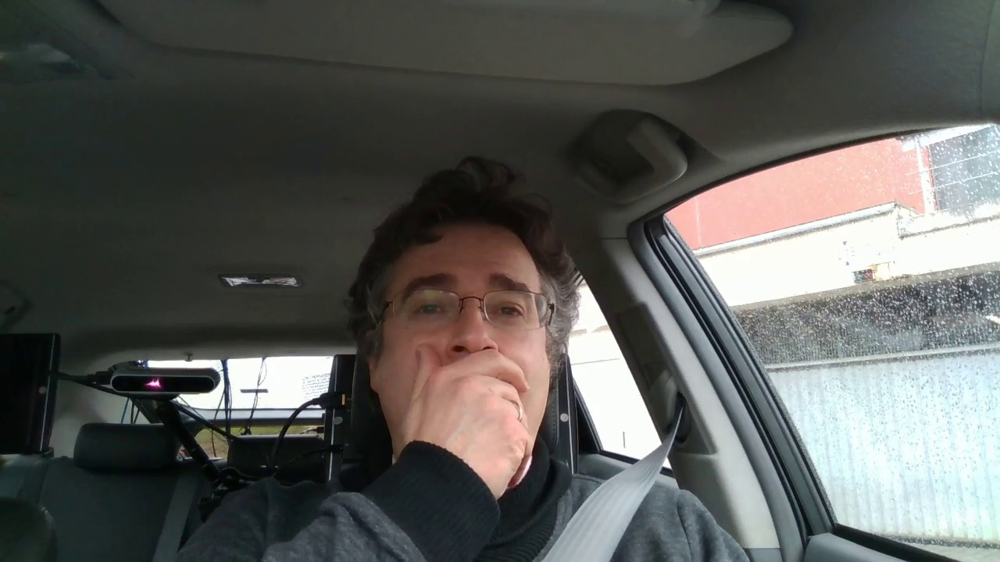

In [5]:
#@title Ejemplo de uso de ViTPose para la identificación de poses

from google.colab import files
from IPython.display import Image, display
import ipywidgets as widgets


upload_button = widgets.Button(description="Subir Imagen")

def on_button_clicked(b):
    uploaded = files.upload()
    for filename in uploaded.keys():
        # Mostrar la imagen
        display(Image(filename=filename))

upload_button.on_click(on_button_clicked)

# Mostrar el botón
display(upload_button)



Saving frame_2414.jpg to frame_2414 (3).jpg


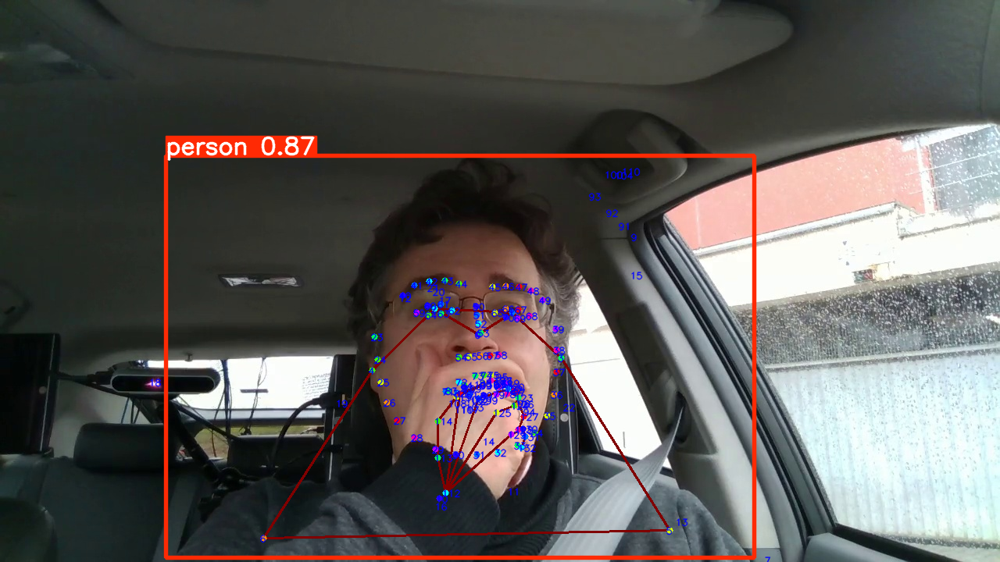

In [9]:
#@title Custom image
from google.colab import files
import numpy as np
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

# 📌 Cargar imagen en RGB y convertir a NumPy con 3 canales
img = np.array(Image.open(list(files.upload().keys())[0]).convert("RGB"), dtype=np.uint8)

# 📌 Asegurar que la imagen es contigua en memoria y tiene 3 canales
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)  # Convertir a BGR para OpenCV
img = np.ascontiguousarray(img)  # Evitar problemas de compatibilidad

# 📌 Realizar inferencia con ViTPose
frame_keypoints = model.inference(img)
img = model.draw(show_yolo=True)
img = np.ascontiguousarray(img)  # Asegurar compatibilidad después del dibujo

# 📌 Extraer puntos clave
if frame_keypoints and len(frame_keypoints) > 0:
    keypoints = frame_keypoints[0]  # Tomamos la primera detección
    landmark_coords = [(int(kp[0]), int(kp[1])) for kp in keypoints]
else:
    landmark_coords = []

# 📌 Dibujar números de los landmarks en la imagen
for idx, (y, x) in enumerate(landmark_coords):
    cv2.putText(img, str(idx), (x - 5, y + 5), cv2.FONT_HERSHEY_SIMPLEX,
                0.4, (255, 0, 0), 1, cv2.LINE_AA)

# 📌 Mostrar imagen corregida
cv2_imshow(img)




Saving imagen_2025-03-12_123123824.png to imagen_2025-03-12_123123824.png


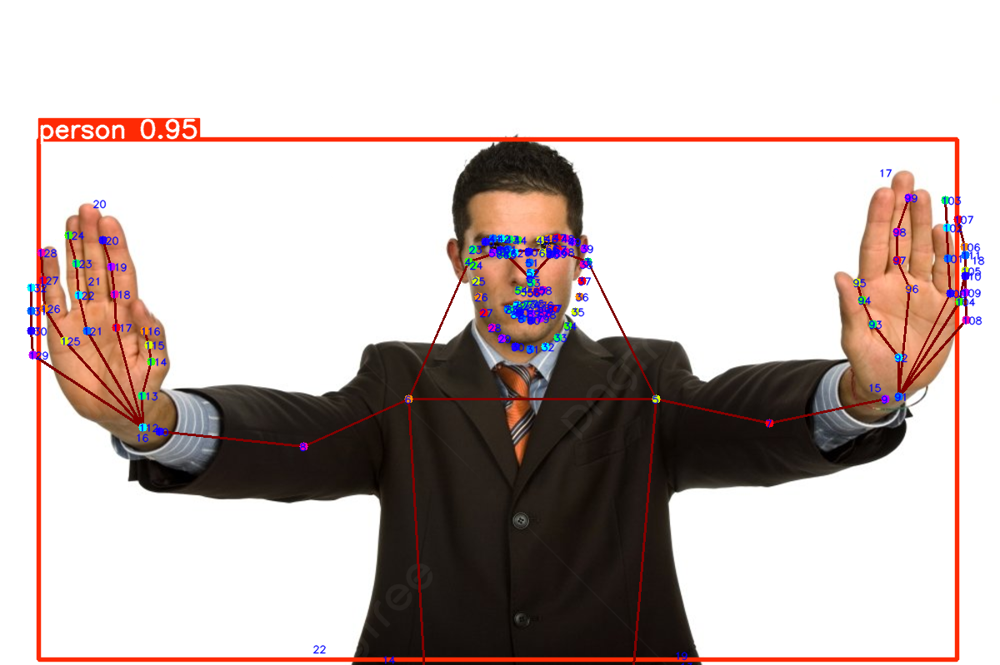

In [10]:
# 📌 Cargar imagen en RGB y convertir a NumPy con 3 canales
img = np.array(Image.open(list(files.upload().keys())[0]).convert("RGB"), dtype=np.uint8)

# 📌 Asegurar que la imagen es contigua en memoria y tiene 3 canales
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)  # Convertir a BGR para OpenCV
img = np.ascontiguousarray(img)  # Evitar problemas de compatibilidad

# 📌 Realizar inferencia con ViTPose
frame_keypoints = model.inference(img)
img = model.draw(show_yolo=True)
img = np.ascontiguousarray(img)  # Asegurar compatibilidad después del dibujo

# 📌 Extraer puntos clave
if frame_keypoints and len(frame_keypoints) > 0:
    keypoints = frame_keypoints[0]  # Tomamos la primera detección
    landmark_coords = [(int(kp[0]), int(kp[1])) for kp in keypoints]
else:
    landmark_coords = []

# 📌 Dibujar números de los landmarks en la imagen
for idx, (y, x) in enumerate(landmark_coords):
    cv2.putText(img, str(idx), (x - 5, y + 5), cv2.FONT_HERSHEY_SIMPLEX,
                0.4, (255, 0, 0), 1, cv2.LINE_AA)

# 📌 Mostrar imagen corregida
cv2_imshow(img)

Saving frame_2414.jpg to frame_2414 (5).jpg
BBox: x_min=202, y_min=190, x_max=973, y_max=720
Landmark 9 dentro del bbox: True
Landmark 10 dentro del bbox: True


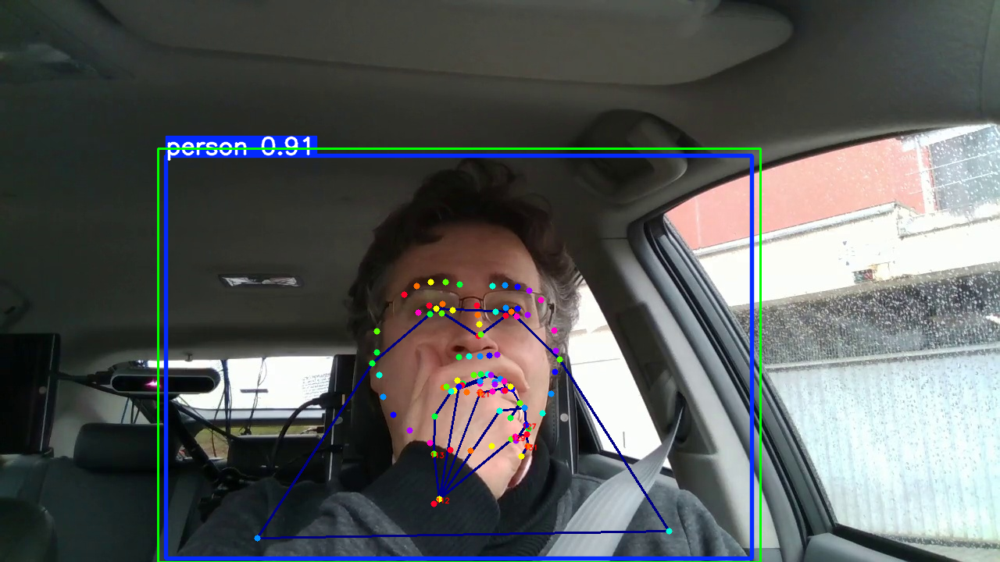

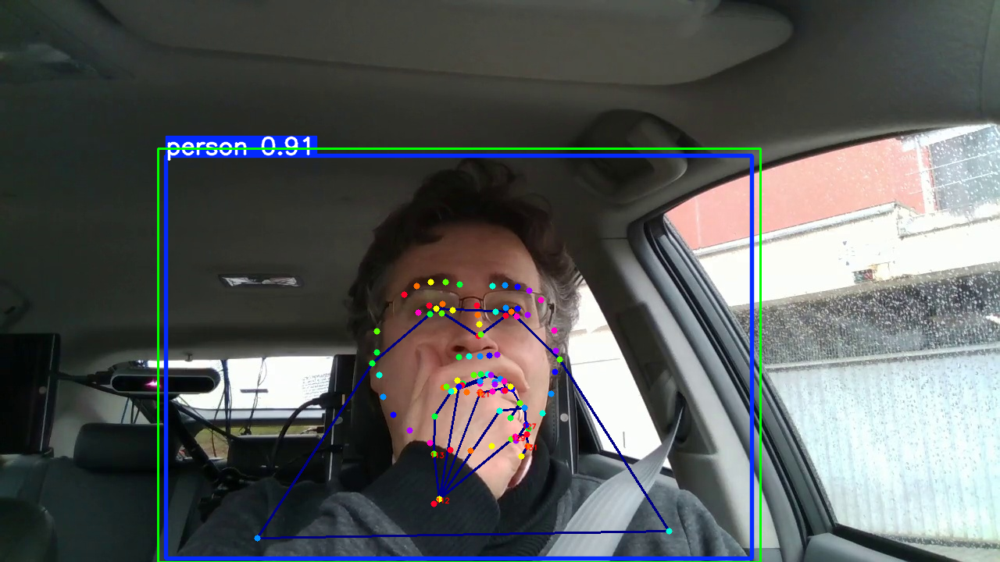


DataFrame con coordenadas normalizadas de los landmarks seleccionados:


,lmk_hand_91_x,lmk_hand_91_y,lmk_hand_92_x,lmk_hand_92_y,lmk_hand_94_x,lmk_hand_94_y,lmk_hand_96_x,lmk_hand_96_y,lmk_hand_98_x,lmk_hand_98_y,...,lmk_hand_123_x,lmk_hand_123_y,lmk_hand_125_x,lmk_hand_125_y,lmk_hand_127_x,lmk_hand_127_y,lmk_hand_129_x,lmk_hand_129_y,lmk_hand_131_x,lmk_hand_131_y
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.526499,0.756388,0.515017,0.77663,0.527896,0.793248


In [12]:
import pandas as pd

# Listas de landmarks dependientes
LANDMARKS_DEPEND_ON_9 = [91, 92, 94, 96, 98, 100, 102, 104, 106, 108, 110]
LANDMARKS_DEPEND_ON_10 = [112, 113, 115, 117, 119, 121, 123, 125, 127, 129, 131]

# Cargar imagen
img = np.array(Image.open(list(files.upload().keys())[0]).convert("RGB"), dtype=np.uint8)

# Realizar inferencia con ViTPose
frame_keypoints = model.inference(img)  # Sin return_bbox

# Obtener bounding boxes después de la inferencia
bboxes, ids, scores = model._tracker_res  # Extraer bounding boxes, IDs y puntuaciones

# Dibujar los keypoints y bounding boxes en la imagen
img = model.draw(show_yolo=True)
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)  # Convertir a BGR para OpenCV

# Verificar si hay keypoints detectados
if frame_keypoints and len(frame_keypoints) > 0:
    keypoints = frame_keypoints[0]  # Tomamos la primera detección
    landmark_coords = [(int(kp[1]), int(kp[0])) for kp in keypoints]  # Guardamos como (y, x)
else:
    landmark_coords = []

# Tomar el primer bounding box detectado
if len(bboxes) > 0:
    bbox_x_min, bbox_y_min, bbox_x_max, bbox_y_max = bboxes[0]
else:
    bbox_x_min, bbox_y_min, bbox_x_max, bbox_y_max = 0, 0, img.shape[1], img.shape[0]

# Función para verificar si un punto está dentro del bounding box
def is_inside_bbox(x, y):
    return bbox_x_min <= x <= bbox_x_max and bbox_y_min <= y <= bbox_y_max

# Verificar si landmarks 9 y 10 están dentro del bounding box
if len(keypoints) > 10:
    landmark_9_in_bbox = is_inside_bbox(keypoints[9][1], keypoints[9][0])
    landmark_10_in_bbox = is_inside_bbox(keypoints[10][1], keypoints[10][0])
else:
    landmark_9_in_bbox = landmark_10_in_bbox = False

# Mostrar información de los bounding boxes y landmarks clave
print(f"BBox: x_min={bbox_x_min}, y_min={bbox_y_min}, x_max={bbox_x_max}, y_max={bbox_y_max}")
print(f"Landmark 9 dentro del bbox: {landmark_9_in_bbox}")
print(f"Landmark 10 dentro del bbox: {landmark_10_in_bbox}")

# 📌 Parámetro de confianza mínima para aceptar un punto
THRESHOLD_CONFIDENCE = 0.7

# 📌 Crear diccionario de coordenadas normalizadas
h, w, _ = img.shape
landmarks_dict = {}

for idx in LANDMARKS_DEPEND_ON_9 + LANDMARKS_DEPEND_ON_10:
    if idx < len(keypoints):  # Asegurar que el índice existe
        y, x, conf = keypoints[idx]  # Obtener coordenadas y confianza

        inside = is_inside_bbox(x, y)  # Verificar si está dentro del bounding box

        # 📌 Aplicar criterios para aceptar el punto clave:
        if inside and conf >= THRESHOLD_CONFIDENCE:
            # Normalizar coordenadas (0 a 1)
            norm_x = x / w
            norm_y = y / h

            # Guardar en el diccionario con el formato requerido
            landmarks_dict[f'lmk_hand_{idx}_x'] = norm_x
            landmarks_dict[f'lmk_hand_{idx}_y'] = norm_y
        else:
            # Si no cumple con las condiciones, guardar NaN
            landmarks_dict[f'lmk_hand_{idx}_x'] = np.nan
            landmarks_dict[f'lmk_hand_{idx}_y'] = np.nan

# 📌 Crear DataFrame con los landmarks seleccionados
df_landmarks = pd.DataFrame([landmarks_dict])


# Dibujar números de los landmarks en la imagen
for idx in LANDMARKS_DEPEND_ON_9 + LANDMARKS_DEPEND_ON_10:
    if not np.isnan(landmarks_dict[f'lmk_hand_{idx}_x']):  # Solo dibujar si el landmark fue guardado
        x = int(landmarks_dict[f'lmk_hand_{idx}_x'] * w)
        y = int(landmarks_dict[f'lmk_hand_{idx}_y'] * h)
        cv2.putText(img, str(idx), (x - 5, y + 5), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0, 0, 255), 1, cv2.LINE_AA)

# Dibujar la bounding box en la imagen
cv2.rectangle(img, (bbox_x_min, bbox_y_min), (bbox_x_max, bbox_y_max), (0, 255, 0), 2)  # Verde, grosor 2

# Mostrar imagen con landmarks numerados y bounding box
cv2_imshow(img)


# Mostrar imagen con landmarks numerados
cv2_imshow(img)

# Mostrar DataFrame
print("\nDataFrame con coordenadas normalizadas de los landmarks seleccionados:")
display(df_landmarks)

# Extracción de Malla Facial: Mediapipe

# Descarga de Dependencias Necesarias

In [ ]:
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from urllib.request import urlopen
!pip install mediapipe
import mediapipe as mp
import pandas as pd

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 9.9 MB/s eta 0:00:00


Button(description='Subir Imagen', style=ButtonStyle())

Saving frame_4560.jpg to frame_4560 (1).jpg


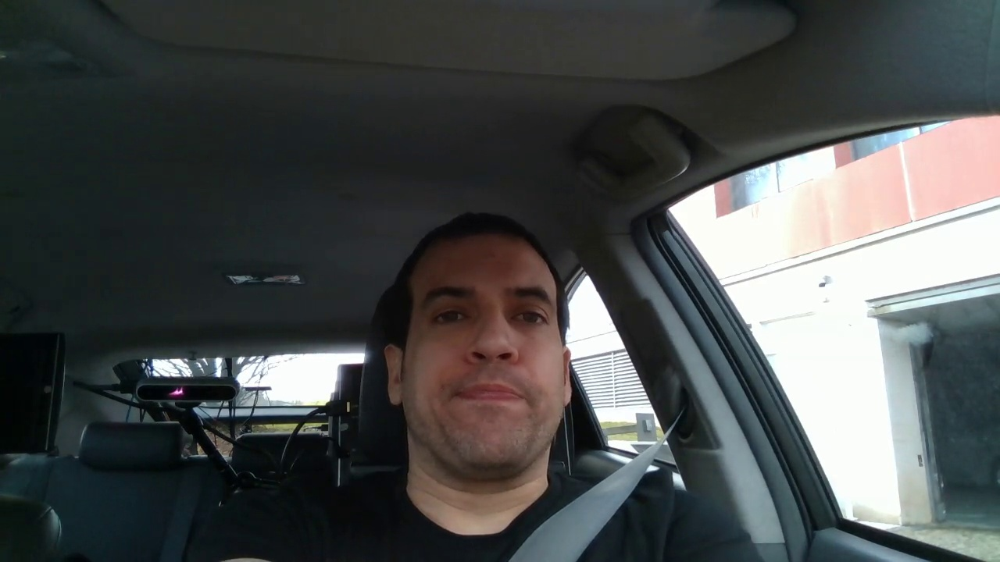

In [ ]:
#@title Detección del FaceMesh en Imagen de Ejemplo
# Widget para cargar imagen
from google.colab import files
from IPython.display import Image, display
import ipywidgets as widgets


upload_button = widgets.Button(description="Subir Imagen")

def on_button_clicked(b):
    uploaded = files.upload()
    for filename in uploaded.keys():
        # Mostrar la imagen
        display(Image(filename=filename))

upload_button.on_click(on_button_clicked)

# Mostrar el botón
display(upload_button)


FileUpload(value={}, accept='image/*', description='Upload')

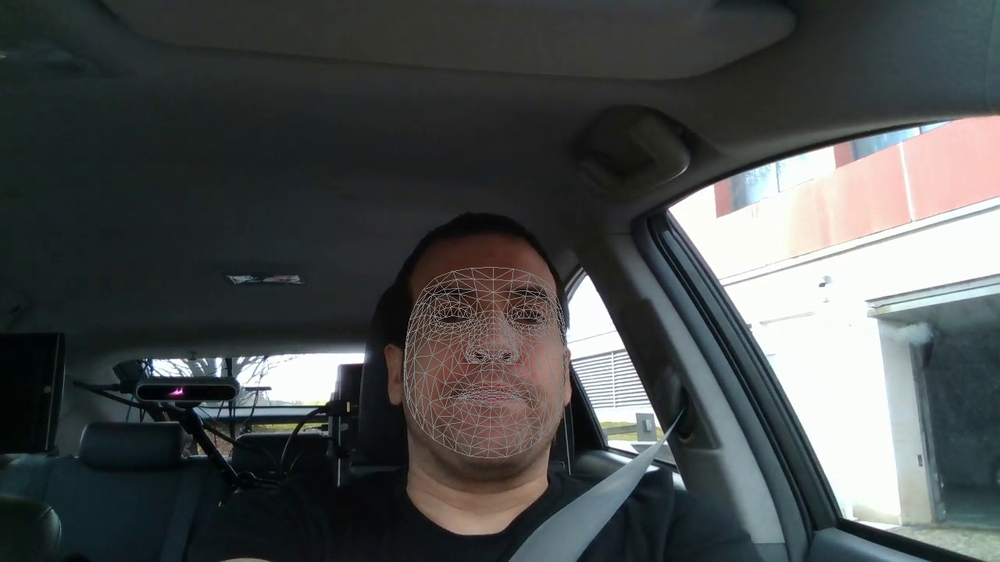

In [ ]:
#@Detección del FaceMesh
import cv2
import importlib.util
import os

# Verificar si mediapipe está instalado
if importlib.util.find_spec("mediapipe") is None:
    print("⚠️ MediaPipe no está instalado. Instalando...")
    os.system("pip install mediapipe")
    print("✅ Instalación completada.")
import mediapipe as mp
import numpy as np
import ipywidgets as widgets
from IPython.display import display
from google.colab.patches import cv2_imshow
from PIL import Image as PILImage
import io

# Inicializar MediaPipe Face Mesh
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh(static_image_mode=True, min_detection_confidence=0.5)
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# Función para detectar landmarks faciales
def get_face_landmarks(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = face_mesh.process(image_rgb)
    if results.multi_face_landmarks:
        return results.multi_face_landmarks
    return None

# Función para dibujar landmarks sobre la imagen
def draw_landmarks(image, face_landmarks):
    image_bgr = image.copy()
    for landmarks in face_landmarks:
        mp_drawing.draw_landmarks(
            image_bgr,
            landmarks,
            mp_face_mesh.FACEMESH_TESSELATION,
            landmark_drawing_spec=None,
            connection_drawing_spec=mp_drawing_styles.get_default_face_mesh_tesselation_style()
        )
    return image_bgr

# Función para procesar la imagen
def process_image(image_path):
    image = PILImage.open(image_path)
    image = np.array(image)  # PIL -> NumPy (RGB)

    face_landmarks = get_face_landmarks(image)
    if face_landmarks:
        image_with_landmarks = draw_landmarks(image, face_landmarks)
        image_with_landmarks = cv2.cvtColor(image_with_landmarks, cv2.COLOR_RGB2BGR)  # Conversión RGB -> BGR
        cv2_imshow(image_with_landmarks)
    else:
        print("No se detectaron rostros en la imagen.")


# Widget para cargar imagen
upload_button = widgets.FileUpload(accept='image/*', multiple=False)

def handle_upload(change):
    file_content = change['new']
    if file_content:
        file = list(file_content.values())[0]
        image_data = file['content']
        image_path = '/content/rostro.jpg'
        with open(image_path, 'wb') as f:
            f.write(image_data)
        process_image(image_path)

upload_button.observe(handle_upload, names='value')
display(upload_button)

Button(description='Subir Imagen', style=ButtonStyle())

Saving imagen_2025-03-12_095615335.png to imagen_2025-03-12_095615335.png


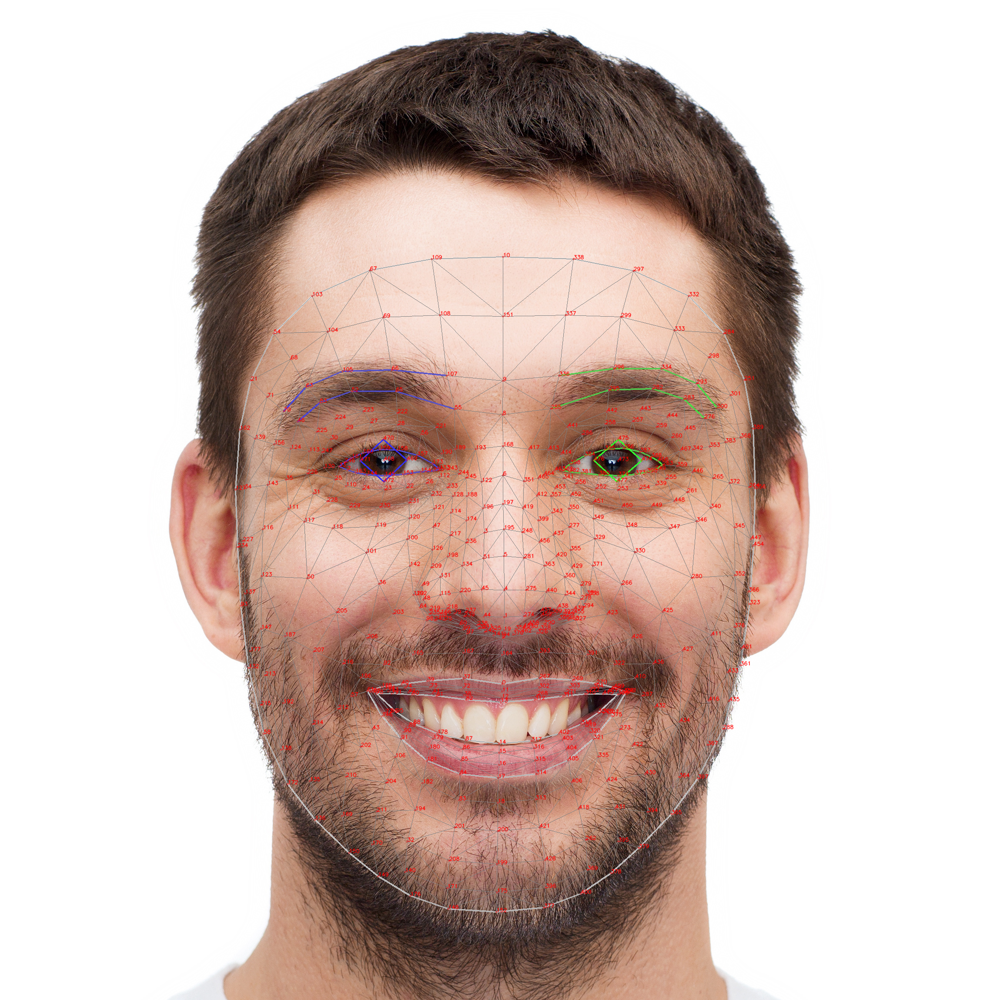

In [ ]:
upload_button = widgets.Button(description="Subir Imagen")

def on_button_clicked(b):
    uploaded = files.upload()
    for filename in uploaded.keys():
        # Mostrar la imagen
        display(Image(filename=filename))

upload_button.on_click(on_button_clicked)

# Mostrar el botón
display(upload_button)

FileUpload(value={}, accept='image/*', description='Upload')

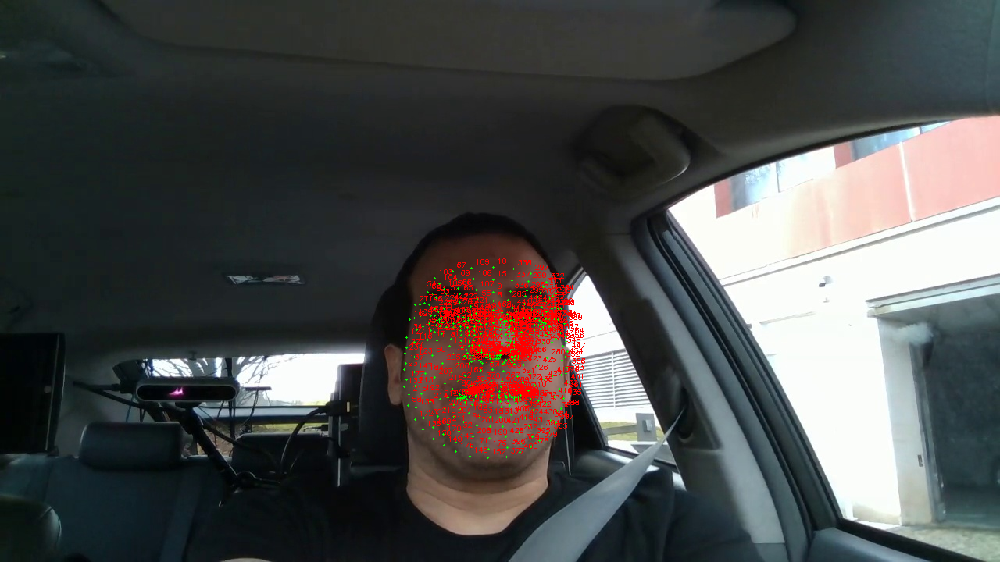


📌 DataFrame con coordenadas de los landmarks:


,lmk_0_x,lmk_0_y,lmk_0_z,lmk_1_x,lmk_1_y,lmk_1_z,lmk_2_x,lmk_2_y,lmk_2_z,lmk_3_x,...,lmk_464_z,lmk_465_x,lmk_465_y,lmk_465_z,lmk_466_x,lmk_466_y,lmk_466_z,lmk_467_x,lmk_467_y,lmk_467_z
0,629.927711,489.998646,-0.029437,632.504539,448.742838,-0.037802,630.66246,464.663315,-0.024217,623.605881,...,0.013168,645.809784,411.986618,0.007486,693.355179,412.637773,0.024353,698.446274,408.287659,0.025242


In [ ]:
#@title Distribución final de los puntos en Mediapipe

import cv2
import importlib.util
import os
import mediapipe as mp
import numpy as np
import pandas as pd
import ipywidgets as widgets
from IPython.display import display
from google.colab.patches import cv2_imshow
from PIL import Image as PILImage

# 📌 Inicializar MediaPipe Face Mesh
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh(static_image_mode=True, min_detection_confidence=0.5)
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# 📌 Función para detectar landmarks faciales
def get_face_landmarks(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = face_mesh.process(image_rgb)
    if results.multi_face_landmarks:
        return results.multi_face_landmarks
    return None

# 📌 Función para dibujar landmarks con números
def draw_landmarks(image, face_landmarks):
    image_bgr = image.copy()
    for landmarks in face_landmarks:
        for idx, landmark in enumerate(landmarks.landmark):
            h, w, _ = image_bgr.shape
            x, y = int(landmark.x * w), int(landmark.y * h)
            cv2.circle(image_bgr, (x, y), 1, (0, 255, 0), -1)  # Dibujar punto
            cv2.putText(image_bgr, str(idx), (x + 5, y - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)  # Dibujar número
    return image_bgr

# 📌 Función para obtener coordenadas y guardarlas en un DataFrame
def get_landmarks_dataframe(face_landmarks, image_shape):
    if not face_landmarks:
        return None

    h, w, _ = image_shape
    landmarks_dict = {}

    for idx, landmark in enumerate(face_landmarks[0].landmark):  # Solo tomamos el primer rostro
        landmarks_dict[f'lmk_{idx}_x'] = landmark.x * w
        landmarks_dict[f'lmk_{idx}_y'] = landmark.y * h
        landmarks_dict[f'lmk_{idx}_z'] = landmark.z  # Z es relativa a la profundidad

    df = pd.DataFrame([landmarks_dict])  # Solo una fila
    return df

# 📌 Función para procesar la imagen
def process_image(image_path):
    image = PILImage.open(image_path)
    image = np.array(image)  # Convertir PIL -> NumPy (RGB)

    face_landmarks = get_face_landmarks(image)
    if face_landmarks:
        image_with_landmarks = draw_landmarks(image, face_landmarks)
        image_with_landmarks = cv2.cvtColor(image_with_landmarks, cv2.COLOR_RGB2BGR)  # Convertir RGB -> BGR
        cv2_imshow(image_with_landmarks)

        # Obtener DataFrame con coordenadas
        df = get_landmarks_dataframe(face_landmarks, image.shape)
        print("\n📌 DataFrame con coordenadas de los landmarks:")
        display(df)  # Mostrar DataFrame
    else:
        print("⚠️ No se detectaron rostros en la imagen.")

# 📌 Widget para cargar imagen
upload_button = widgets.FileUpload(accept='image/*', multiple=False)

def handle_upload(change):
    file_content = change['new']
    if file_content:
        file = list(file_content.values())[0]
        image_data = file['content']
        image_path = '/content/rostro.jpg'
        with open(image_path, 'wb') as f:
            f.write(image_data)
        process_image(image_path)

upload_button.observe(handle_upload, names='value')
display(upload_button)


# **2. Preproceasamiento de Datos**

In [ ]:
#@title Funciones de extracción de Postura
# 📌 Importaciones necesarias
import cv2
import os
import mediapipe as mp
import numpy as np
import pandas as pd
from PIL import Image
from google.colab import drive
from google.colab.patches import cv2_imshow
from easy_ViTPose import VitInference

# 📌 Montar Google Drive
drive.mount('/content/drive')

# 📌 Definir rutas
drive_folder_path = "/content/drive/MyDrive/frames_clasificados_11/all_frames"  # Ruta de la carpeta con imágenes
csv_path = "/content/drive/MyDrive/frames_clasificados_11/DMD_Dataset_Final_11"  # Ruta del archivo CSV en Drive
labels_csv_path = "/content/drive/MyDrive/frames_clasificados_11/frames_actions.csv"  # Ruta del CSV con labels

# 📌 Definir número 'M' manualmente
M = 11


# 📌 Inicializar MediaPipe Face Mesh
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh(static_image_mode=True, min_detection_confidence=0.5)

# 📌 Obtener landmarks faciales con MediaPipe
def get_face_landmarks(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = face_mesh.process(image_rgb)
    return results.multi_face_landmarks if results.multi_face_landmarks else None

def get_landmarks_dataframe(face_landmarks, image_shape):
    if not face_landmarks:
        return None

    h, w, _ = image_shape
    landmarks_dict = {}

    for idx, landmark in enumerate(face_landmarks[0].landmark):  # Solo tomamos el primer rostro
        landmarks_dict[f'lmk_{idx}_x'] = landmark.x
        landmarks_dict[f'lmk_{idx}_y'] = landmark.y
        landmarks_dict[f'lmk_{idx}_z'] = landmark.z  # Z es relativa a la profundidad

    df = pd.DataFrame([landmarks_dict])  # Solo una fila
    return df

# 📌 Obtener landmarks corporales con ViTPose
def get_vitpose_landmarks(img):
    # Listas de landmarks dependientes
    LANDMARKS_DEPEND_ON_9 = [91, 92, 94, 96, 98, 100, 102, 104, 106, 108, 110]
    LANDMARKS_DEPEND_ON_10 = [112, 113, 115, 117, 119, 121, 123, 125, 127, 129, 131]

    # Realizar inferencia con ViTPose
    frame_keypoints = model.inference(img)  # Sin return_bbox

    # Obtener bounding boxes después de la inferencia
    bboxes, ids, scores = model._tracker_res  # Extraer bounding boxes, IDs y puntuaciones

    # Verificar si hay keypoints detectados
    if frame_keypoints and len(frame_keypoints) > 0:
        keypoints = frame_keypoints[0]  # Tomamos la primera detección
        landmark_coords = [(int(kp[1]), int(kp[0])) for kp in keypoints]  # Guardamos como (y, x)
    else:
        landmark_coords = []

    # Tomar el primer bounding box detectado
    if len(bboxes) > 0:
        bbox_x_min, bbox_y_min, bbox_x_max, bbox_y_max = bboxes[0]
    else:
        bbox_x_min, bbox_y_min, bbox_x_max, bbox_y_max = 0, 0, img.shape[1], img.shape[0]

    # Función para verificar si un punto está dentro del bounding box
    def is_inside_bbox(x, y):
        return bbox_x_min <= x <= bbox_x_max and bbox_y_min <= y <= bbox_y_max

    # Verificar si landmarks 9 y 10 están dentro del bounding box
    if len(keypoints) > 10:
        landmark_9_in_bbox = is_inside_bbox(keypoints[9][1], keypoints[9][0])
        landmark_10_in_bbox = is_inside_bbox(keypoints[10][1], keypoints[10][0])
    else:
        landmark_9_in_bbox = landmark_10_in_bbox = False

    # 📌 Parámetro de confianza mínima para aceptar un punto
    THRESHOLD_CONFIDENCE = 0.7

    # 📌 Crear diccionario de coordenadas normalizadas
    h, w, _ = img.shape
    landmarks_dict = {}

    for idx in LANDMARKS_DEPEND_ON_9 + LANDMARKS_DEPEND_ON_10:
        if idx < len(keypoints):  # Asegurar que el índice existe
            y, x, conf = keypoints[idx]  # Obtener coordenadas y confianza

            inside = is_inside_bbox(x, y)  # Verificar si está dentro del bounding box

            # 📌 Aplicar criterios para aceptar el punto clave:
            if inside and conf >= THRESHOLD_CONFIDENCE:
                # Normalizar coordenadas (0 a 1)
                norm_x = x / w
                norm_y = y / h

                # Guardar en el diccionario con el formato requerido
                landmarks_dict[f'lmk_hand_{idx}_x'] = norm_x
                landmarks_dict[f'lmk_hand_{idx}_y'] = norm_y
            else:
                # Si no cumple con las condiciones, guardar NaN
                landmarks_dict[f'lmk_hand_{idx}_x'] = np.nan
                landmarks_dict[f'lmk_hand_{idx}_y'] = np.nan



    return pd.DataFrame([landmarks_dict])

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# 📌 Procesar imágenes de la carpeta en Google Drive
print(drive_folder_path, csv_path, labels_csv_path)
dataframes = []
for i, filename in enumerate(sorted(os.listdir(drive_folder_path))):
    if filename.endswith(('.jpg', '.png', '.jpeg')):
        image_path = os.path.join(drive_folder_path, filename)
        image = np.array(Image.open(image_path).convert("RGB"), dtype=np.uint8)

        face_landmarks = get_face_landmarks(image)
        df_face = get_landmarks_dataframe(face_landmarks, image.shape)

        df_vitpose = get_vitpose_landmarks(image)

        df_combined = pd.concat([df_face, df_vitpose], axis=1)

        dataframes.append(df_combined)

df_all = pd.concat(dataframes, ignore_index=True)

# 📌 Leer CSV con etiquetas y unirlo
df_labels = pd.read_csv(labels_csv_path)
df_final = pd.concat([df_all, df_labels], axis=1)

# 📌 Leer Dataset_DMD si existe y actualizarlo
if os.path.exists(csv_path):
    df_existing = pd.read_csv(csv_path)
    df_final = pd.concat([df_existing, df_final], ignore_index=True)

# 📌 1. Modificar la columna "index" con el formato "1.i"
df_final["index"] = ["11." + str(i + 1) for i in range(len(df_final))]

# 📌 2. Eliminar la columna "Unnamed: 0" si existe
if "Unnamed: 0" in df_final.columns:
    df_final.drop(columns=["Unnamed: 0"], inplace=True)

# 📌 3. Establecer la columna "index" como índice
df_final.set_index("index", inplace=True)

# 📌 4. Guardar el DataFrame modificado en Google Drive
df_final.to_csv(csv_path)


print(f"✅ Dataset actualizado y guardado en: {csv_path}")

/content/drive/MyDrive/frames_clasificados_11/all_frames /content/drive/MyDrive/frames_clasificados_11/DMD_Dataset_Final_11 /content/drive/MyDrive/frames_clasificados_11/frames_actions.csv
✅ Dataset actualizado y guardado en: /content/drive/MyDrive/frames_clasificados_11/DMD_Dataset_Final_11


**Nota: El anterior Script demora alrededor de 1h y 50 minutos para ser ejecutado con todas las imágenes de cada carpeta**

In [ ]:
#@title Juntar partes del Dataset Final
import pandas as pd
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

# Definir rutas de los archivos CSV en Google Drive
csv_paths = [
    "/content/drive/MyDrive/frames_clasificados_2/DMD_Dataset_Final_1",
    "/content/drive/MyDrive/frames_clasificados_2/DMD_Dataset_Final_2",
    "/content/drive/MyDrive/frames_clasificados_11/DMD_Dataset_Final_11",
    "/content/drive/MyDrive/frames_clasificados_12/DMD_Dataset_Final_12"
]

# Leer los archivos CSV como DataFrames
dfs = [pd.read_csv(path) for path in csv_paths]

# Unir los DataFrames en uno solo (por filas, manteniendo las mismas columnas)
df_final = pd.concat(dfs, ignore_index=False)

#  Guardar el DataFrame combinado en Google Drive
output_path = "/content/drive/MyDrive/DMD_Dataset_Processed.csv"
df_final.to_csv(output_path)

#  Confirmación
print(f"Dataset combinado guardado en: {output_path}")

# Mostrar las primeras filas del DataFrame final
df_final.head()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-6-7a3683f8c2ed>:16: DtypeWarning: Columns (1451) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [pd.read_csv(path) for path in csv_paths]
<ipython-input-6-7a3683f8c2ed>:16: DtypeWarning: Columns (1451) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [pd.read_csv(path) for path in csv_paths]
<ipython-input-6-7a3683f8c2ed>:16: DtypeWarning: Columns (1451) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [pd.read_csv(path) for path in csv_paths]
<ipython-input-6-7a3683f8c2ed>:16: DtypeWarning: Columns (1451) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = [pd.read_csv(path) for path in csv_paths]


Dataset combinado guardado en: /content/drive/MyDrive/DMD_Dataset_Processed.csv


,index,lmk_0_x,lmk_0_y,lmk_0_z,lmk_1_x,lmk_1_y,lmk_1_z,lmk_2_x,lmk_2_y,lmk_2_z,...,lmk_hand_127_x,lmk_hand_127_y,lmk_hand_129_x,lmk_hand_129_y,lmk_hand_131_x,lmk_hand_131_y,blinks,eyes_state,yawning,occlusion
0,1.1,0.466321,0.664493,-0.030458,0.464244,0.610660,-0.037667,0.463933,0.632606,-0.024851,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,eyes_state/open,NaN,NaN
1,1.2,0.466716,0.667113,-0.030338,0.464099,0.612234,-0.037929,0.464176,0.634038,-0.024461,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,eyes_state/open,NaN,NaN
2,1.3,0.446711,0.726543,-0.025353,0.444824,0.676071,-0.040332,0.445900,0.693371,-0.023093,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,eyes_state/open,NaN,NaN
3,1.4,0.472639,0.689401,-0.027664,0.472933,0.639516,-0.037768,0.472006,0.659946,-0.023609,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,eyes_state/open,NaN,NaN
4,1.5,0.472732,0.689614,-0.027691,0.473167,0.639140,-0.037587,0.472129,0.659548,-0.023432,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,eyes_state/open,NaN,NaN


In [ ]:
#@title Tamaño final del Dataset
df_final.shape

(21704, 1453)

# **3. Tableros y Análisis Gráfico del Dataset**

Por comodidad, y teniendo en cuenta la continiuidad de los videos, en las próximas celdas se analiza uno de los 4 videos que componen el dataset; es decir, el sub-set **"DMD_Dataset_Final_1"**

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

file_path = "/content/drive/MyDrive/frames_clasificados_2/DMD_Dataset_Final_1"

df = pd.read_csv(file_path, encoding="utf-8", on_bad_lines="skip")

df.head()
df.dtypes
df.describe()

<ipython-input-16-06a626c7760b>:7: DtypeWarning: Columns (1451) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path, encoding="utf-8", on_bad_lines="skip")


,index,lmk_0_x,lmk_0_y,lmk_0_z,lmk_1_x,lmk_1_y,lmk_1_z,lmk_2_x,lmk_2_y,lmk_2_z,...,lmk_hand_123_y,lmk_hand_125_x,lmk_hand_125_y,lmk_hand_127_x,lmk_hand_127_y,lmk_hand_129_x,lmk_hand_129_y,lmk_hand_131_x,lmk_hand_131_y,occlusion
count,5480.000000,5473.000000,5473.000000,5473.000000,5473.000000,5473.000000,5473.000000,5473.000000,5473.000000,5473.000000,...,198.000000,217.000000,217.000000,330.000000,330.000000,297.000000,297.000000,328.000000,328.000000,0.0
mean,1.364953,0.471458,0.706135,-0.027394,0.472419,0.652728,-0.039675,0.471230,0.672567,-0.023998,...,0.758977,0.490883,0.775616,0.516251,0.805669,0.510466,0.820134,0.519559,0.846736,NaN
std,0.183083,0.020968,0.018565,0.002320,0.023488,0.018959,0.002100,0.021148,0.017601,0.001295,...,0.043424,0.021571,0.030764,0.033727,0.045762,0.019733,0.034155,0.019029,0.043661,NaN
min,1.100000,0.301847,0.649777,-0.038453,0.287350,0.591415,-0.045016,0.305747,0.616443,-0.029713,...,0.712217,0.378724,0.725441,0.066363,0.748214,0.416231,0.767262,0.425784,0.785497,NaN
25%,1.223075,0.466740,0.695378,-0.028501,0.467269,0.640653,-0.040932,0.466376,0.661792,-0.024452,...,0.732959,0.487063,0.749939,0.515236,0.770775,0.505412,0.791702,0.517839,0.810403,NaN
50%,1.346450,0.473818,0.708024,-0.027263,0.474818,0.653899,-0.039776,0.473547,0.673563,-0.023905,...,0.752271,0.497303,0.780876,0.522434,0.800479,0.513638,0.826930,0.524602,0.848491,NaN
75%,1.469825,0.480603,0.719437,-0.026088,0.482763,0.666112,-0.038695,0.480692,0.684703,-0.023504,...,0.760586,0.501276,0.790626,0.529035,0.820942,0.517421,0.834885,0.529832,0.863222,NaN
max,1.999000,0.523128,0.799451,-0.010711,0.538427,0.760988,-0.022871,0.526234,0.770015,-0.012515,...,0.982387,0.650477,0.886947,0.539309,0.996329,0.659685,0.984675,0.541784,0.994219,NaN


# **PUNTOS DE LAS COORDENADAS DEL PRIMER FRAME.**

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


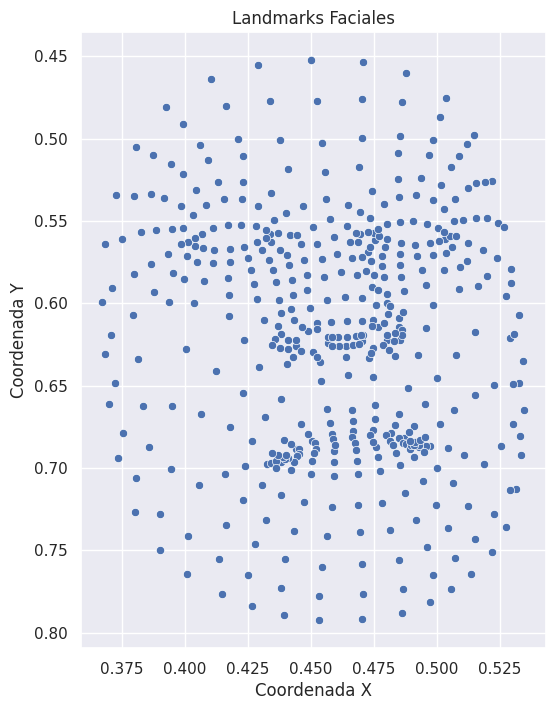

In [19]:
x_points = df.filter(like='_x').iloc[0].values
y_points = df.filter(like='_y').iloc[0].values

plt.figure(figsize=(6,8))
sns.scatterplot(x=x_points, y=y_points)

plt.xlabel('Coordenada X')
plt.ylabel('Coordenada Y')
plt.title('Landmarks Faciales')

plt.gca().invert_yaxis()

plt.show()

sns.set()  # Aplica el estilo de Seaborn a todas las gráficas


# ***Matriz de Correlación - Variables Seleccionadas***

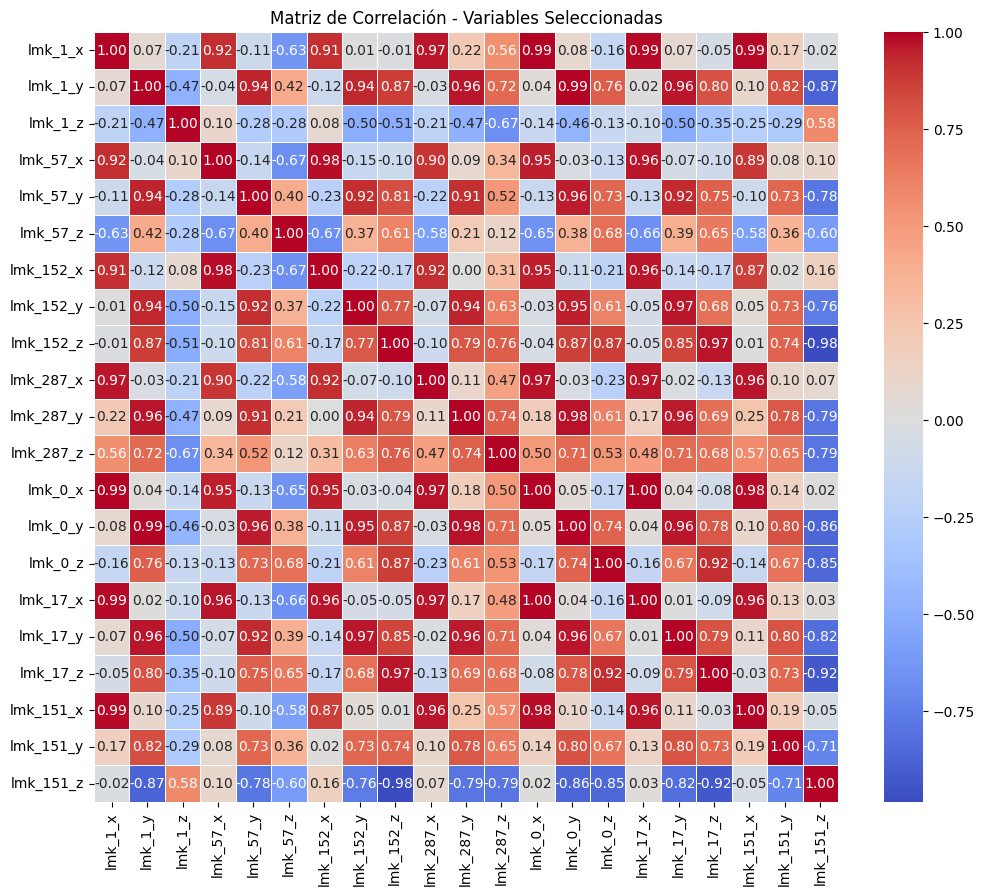

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Cargar el dataset
ruta = "/content/drive/My Drive/PRUEBA PROYECTO/PROYECTO 1/DMD_Dataset_Final"
df = pd.read_csv(ruta, low_memory=False)

# Seleccionar columnas relevantes
df_reducido = df[[
    "yawning", "eyes_state",
    "lmk_1_x", "lmk_1_y", "lmk_1_z",
    "lmk_57_x", "lmk_57_y", "lmk_57_z",
    "lmk_152_x", "lmk_152_y", "lmk_152_z",
    "lmk_287_x", "lmk_287_y", "lmk_287_z",
    "lmk_0_x", "lmk_0_y", "lmk_0_z",
    "lmk_17_x", "lmk_17_y", "lmk_17_z",
    "lmk_151_x", "lmk_151_y", "lmk_151_z"
]].dropna()

# Calcular matriz de correlación
corr = df_reducido.corr(numeric_only=True)

# Graficar la matriz de correlación con valores en cada celda
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)

plt.title("Matriz de Correlación - Variables Seleccionadas")
plt.show()


# **Análisis datos en X, Y**

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_conte

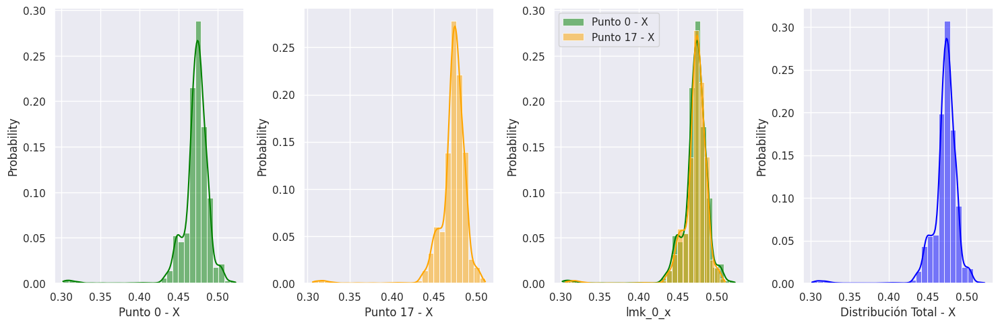

In [26]:
plt.figure(figsize=(15, 5))

# Punto 0 (Nariz) - Coordenada X
plt.subplot(1, 4, 1)
sns.histplot(df["lmk_0_x"], kde=True, color="green", bins=30, stat="probability").set(xlabel="Punto 0 - X")

# Punto 17 (Centro de la cara abajo) - Coordenada X
plt.subplot(1, 4, 2)
sns.histplot(df["lmk_17_x"], kde=True, color="orange", bins=30, stat="probability").set(xlabel="Punto 17 - X")

# Comparación X de ambos puntos
plt.subplot(1, 4, 3)
sns.histplot(df["lmk_0_x"], kde=True, color="green", bins=30, stat="probability", label="Punto 0 - X")
sns.histplot(df["lmk_17_x"], kde=True, color="orange", bins=30, stat="probability", label="Punto 17 - X")
plt.legend()

# Distribución total de ambas coordenadas
plt.subplot(1, 4, 4)
sns.histplot(df[["lmk_0_x", "lmk_17_x"]].stack(), kde=True, color="blue", bins=30, stat="probability").set(xlabel="Distribución Total - X")

plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_conte

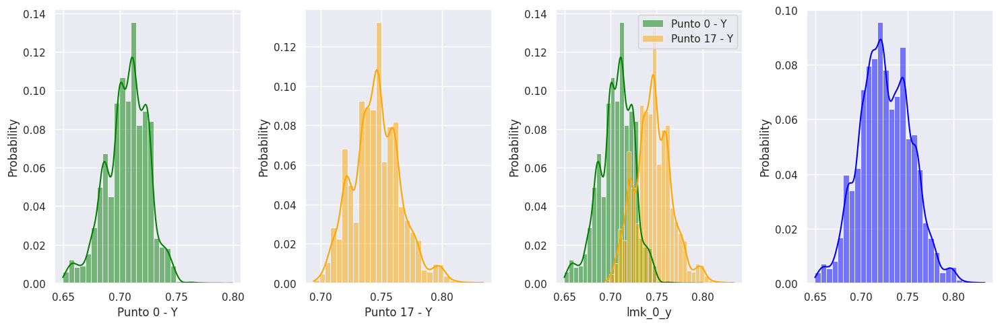

In [27]:
plt.figure(figsize=(15, 5))

# Punto 0 (Nariz) - Coordenada Y
plt.subplot(1, 4, 1)
sns.histplot(df["lmk_0_y"], kde=True, color="green", bins=30, stat="probability").set(xlabel="Punto 0 - Y")

# Punto 17 (Centro de la cara abajo) - Coordenada Y
plt.subplot(1, 4, 2)
sns.histplot(df["lmk_17_y"], kde=True, color="orange", bins=30, stat="probability").set(xlabel="Punto 17 - Y")

# Comparación Y de ambos puntos
plt.subplot(1, 4, 3)
sns.histplot(df["lmk_0_y"], kde=True, color="green", bins=30, stat="probability", label="Punto 0 - Y")
sns.histplot(df["lmk_17_y"], kde=True, color="orange", bins=30, stat="probability", label="Punto 17 - Y")
plt.legend()

# Distribución total de ambas coordenadas Y
plt.subplot(1, 4, 4)
sns.histplot(df[["lmk_0_y", "lmk_17_y"]].stack(), kde=True, color="blue", bins=30, stat="probability")

plt.tight_layout()
plt.show()

# ***Gráfica variación de la distancia en X, Y y Z entre lmk_0 y lmk_17.  Donde los puntos "0" y "17" son los puntos relacionados a la accion de abrir y cerrar la boca.***

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_conte

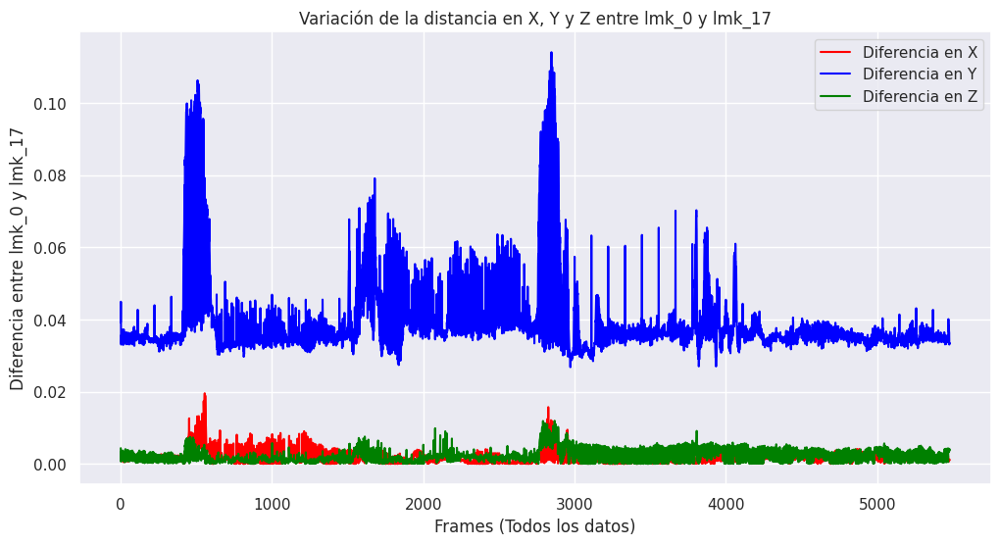

In [28]:
# Calcular diferencias absolutas entre los puntos 0 y 17 en X, Y y Z
df["dist_x"] = abs(df["lmk_0_x"] - df["lmk_17_x"])
df["dist_y"] = abs(df["lmk_0_y"] - df["lmk_17_y"])
df["dist_z"] = abs(df["lmk_0_z"] - df["lmk_17_z"])

# Graficar las diferencias en X, Y y Z
plt.figure(figsize=(12, 6))

sns.lineplot(x=df.index, y=df["dist_x"], label="Diferencia en X", color="red")
sns.lineplot(x=df.index, y=df["dist_y"], label="Diferencia en Y", color="blue")
sns.lineplot(x=df.index, y=df["dist_z"], label="Diferencia en Z", color="green")

plt.xlabel("Frames (Todos los datos)")
plt.ylabel("Diferencia entre lmk_0 y lmk_17")
plt.title("Variación de la distancia en X, Y y Z entre lmk_0 y lmk_17")
plt.legend()
plt.show()

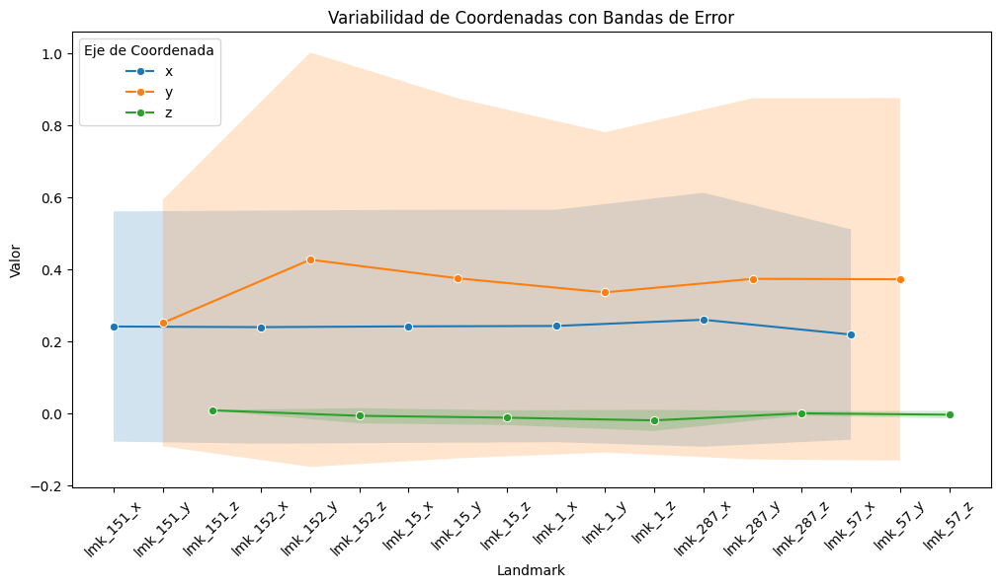

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Agrupar los datos por coordenada y calcular la media y la desviación estándar
df_grouped = df_long.groupby(["coordenada", "tipo"])["valor"].agg(["mean", "std"]).reset_index()

# Crear la figura
plt.figure(figsize=(12, 6))

# Graficar líneas con bandas de error sin usar for
sns.lineplot(data=df_grouped, x="coordenada", y="mean", hue="tipo", marker="o")
plt.fill_between(df_grouped[df_grouped["tipo"] == "x"]["coordenada"],
                 df_grouped[df_grouped["tipo"] == "x"]["mean"] - df_grouped[df_grouped["tipo"] == "x"]["std"],
                 df_grouped[df_grouped["tipo"] == "x"]["mean"] + df_grouped[df_grouped["tipo"] == "x"]["std"], alpha=0.2)

plt.fill_between(df_grouped[df_grouped["tipo"] == "y"]["coordenada"],
                 df_grouped[df_grouped["tipo"] == "y"]["mean"] - df_grouped[df_grouped["tipo"] == "y"]["std"],
                 df_grouped[df_grouped["tipo"] == "y"]["mean"] + df_grouped[df_grouped["tipo"] == "y"]["std"], alpha=0.2)

plt.fill_between(df_grouped[df_grouped["tipo"] == "z"]["coordenada"],
                 df_grouped[df_grouped["tipo"] == "z"]["mean"] - df_grouped[df_grouped["tipo"] == "z"]["std"],
                 df_grouped[df_grouped["tipo"] == "z"]["mean"] + df_grouped[df_grouped["tipo"] == "z"]["std"], alpha=0.2)

# Personalizar el gráfico
plt.xticks(rotation=45)
plt.xlabel("Landmark")
plt.ylabel("Valor")
plt.title("Variabilidad de Coordenadas con Bandas de Error")
plt.legend(title="Eje de Coordenada")
plt.show()


# **Gráfica de Distribución de Coordenadas en X, Y**     



/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

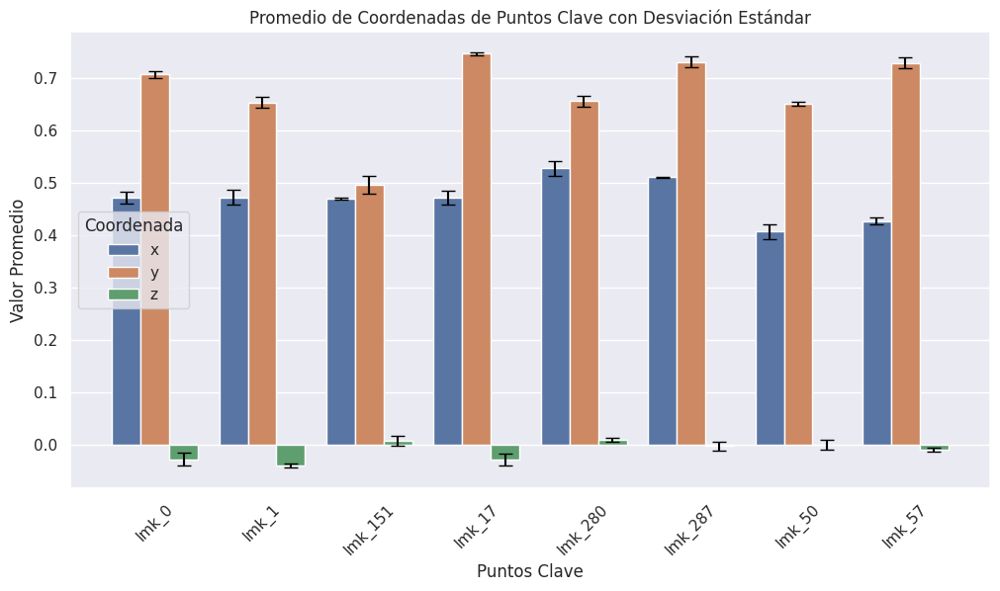

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar los puntos clave específicos en X, Y y Z
df_puntos = df.filter([
    "index",
    "lmk_0_x", "lmk_0_y", "lmk_0_z",
    "lmk_1_x", "lmk_1_y", "lmk_1_z",
    "lmk_17_x", "lmk_17_y", "lmk_17_z",
    "lmk_151_x", "lmk_151_y", "lmk_151_z",
    "lmk_287_x", "lmk_287_y", "lmk_287_z",
    "lmk_57_x", "lmk_57_y", "lmk_57_z",
    "lmk_280_x", "lmk_280_y", "lmk_280_z",
    "lmk_50_x", "lmk_50_y", "lmk_50_z"
])

# Agrupar por index y calcular media y desviación estándar
df_stats = df_puntos.groupby("index", as_index=False).agg(["mean", "std"])

# Restaurar nombres de columnas
df_stats.columns = ['_'.join(col).strip('_') for col in df_stats.columns]

# Transformar a formato largo
df_long = df_stats.melt(ignore_index=False, var_name="coordenada", value_name="valor").reset_index()

# Separar 'landmark', 'axis' y 'stat'
df_long[["landmark", "axis", "stat"]] = df_long["coordenada"].str.rsplit("_", n=2, expand=True)

# Filtrar media y desviación estándar
df_media = df_long[df_long["stat"] == "mean"].rename(columns={"valor": "valor_mean"})
df_desv = df_long[df_long["stat"] == "std"].rename(columns={"valor": "valor_std"})

# Fusionar media y desviación estándar
df_final = df_media.merge(df_desv, on=["index", "landmark", "axis"], how="left")

# Agrupar para obtener el promedio final de cada landmark y coordenada
df_plot = df_final.groupby(["landmark", "axis"], as_index=False).agg({"valor_mean": "mean", "valor_std": "mean"})

# Crear el gráfico de barras con Seaborn
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    data=df_plot,
    x="landmark",
    y="valor_mean",
    hue="axis",
    errorbar=None  # Evita el cálculo automático de error
)

# Obtener posiciones y alturas de las barras dentro de cada grupo de 'hue'
x_posiciones = []
y_valores = []
y_errors = []

for bar, (valor_std) in zip(ax.patches, df_plot["valor_std"]):
    x_posiciones.append(bar.get_x() + bar.get_width() / 2)  # Centrar la barra de error
    y_valores.append(bar.get_height())  # Obtener la altura correcta de cada barra
    y_errors.append(valor_std)

# Agregar las barras de error correctamente alineadas
plt.errorbar(
    x_posiciones,
    y_valores,
    yerr=y_errors,
    fmt="none",
    capsize=5,
    color="black",
    elinewidth=1.5
)

plt.xticks(rotation=45)
plt.xlabel("Puntos Clave")
plt.ylabel("Valor Promedio")
plt.title("Promedio de Coordenadas de Puntos Clave con Desviación Estándar")
plt.legend(title="Coordenada")
plt.show()


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


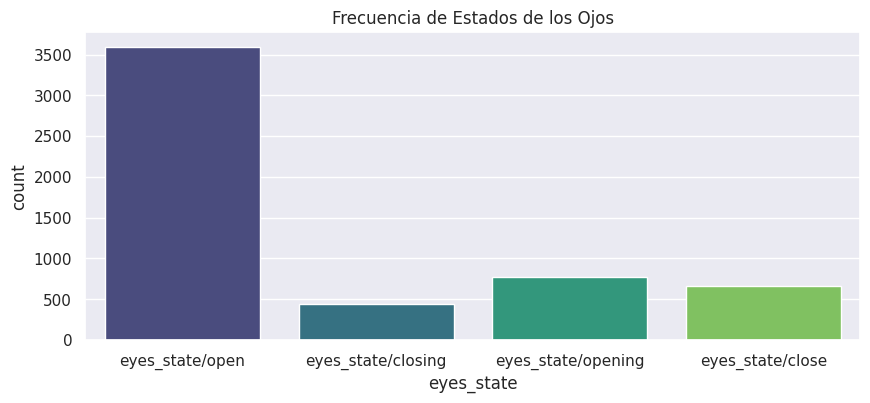

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
sns.countplot(x=df["eyes_state"], palette="viridis")
plt.title("Frecuencia de Estados de los Ojos")
plt.show()


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


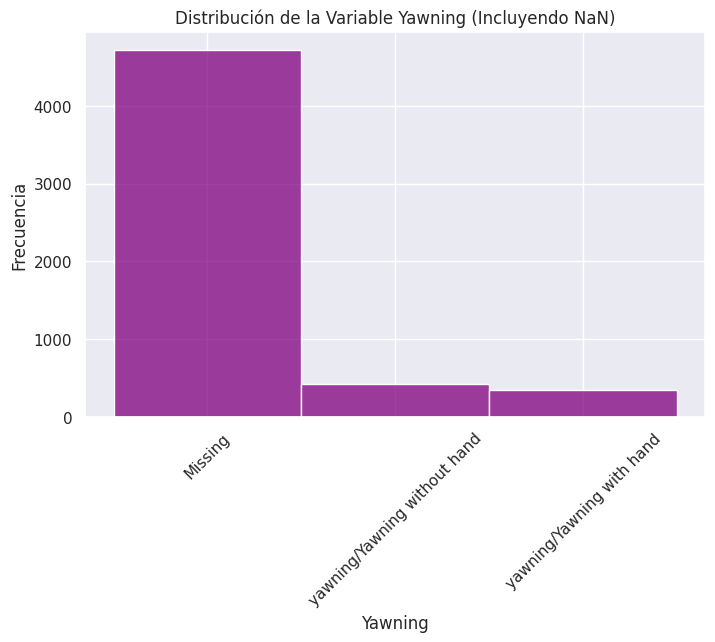

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Reemplazar NaN con una etiqueta específica
df["yawning"] = df["yawning"].fillna("Missing")

plt.figure(figsize=(8, 5))
sns.histplot(df["yawning"], bins=30, color="purple", discrete=True)

plt.title("Distribución de la Variable Yawning (Incluyendo NaN)")
plt.xlabel("Yawning")
plt.ylabel("Frecuencia")
plt.xticks(rotation=45)  # Rotar etiquetas si es necesario
plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

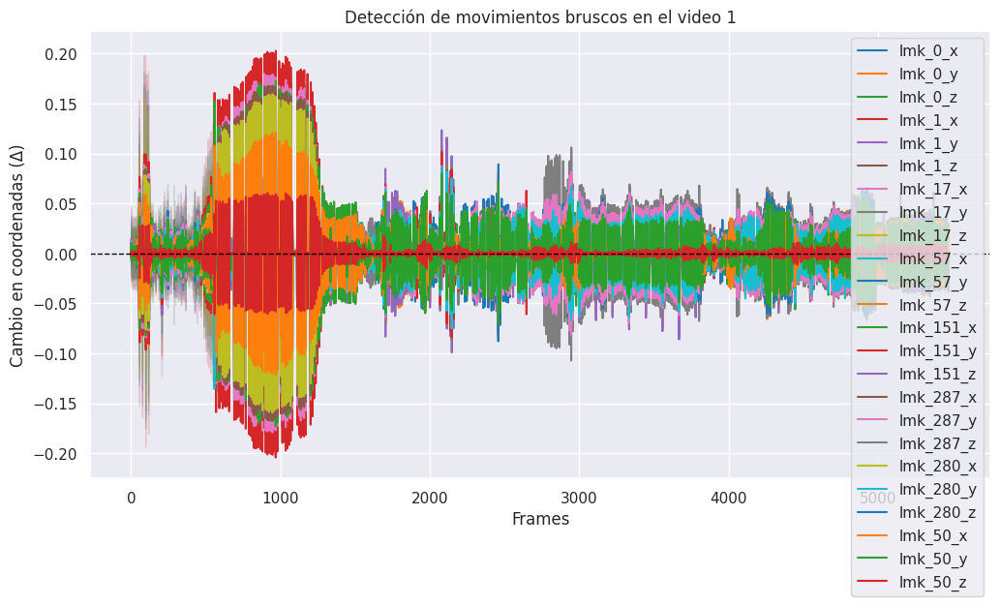

In [36]:
# Filtrar solo el video 1
df['video'] = df['index'].astype(str).apply(lambda x: int(x.split('.')[0]))
df['frame'] = df['index'].astype(str).apply(lambda x: float(x.split('.')[1]))
df_video1 = df[df['video'] == 1]

# Seleccionar los landmarks clave
landmarks = [
    'lmk_0_x', 'lmk_0_y', 'lmk_0_z',
    'lmk_1_x', 'lmk_1_y', 'lmk_1_z',
    'lmk_17_x', 'lmk_17_y', 'lmk_17_z',
    'lmk_57_x', 'lmk_57_y', 'lmk_57_z',
    'lmk_151_x', 'lmk_151_y', 'lmk_151_z',
    'lmk_287_x', 'lmk_287_y', 'lmk_287_z',
    'lmk_280_x', 'lmk_280_y', 'lmk_280_z',
    'lmk_50_x', 'lmk_50_y', 'lmk_50_z'
]

# Calcular diferencias entre frames consecutivos
df_video1_delta = df_video1[['frame'] + landmarks].copy()
df_video1_delta[landmarks] = df_video1_delta[landmarks].diff()

# Graficar los cambios en las coordenadas seleccionadas
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_video1_delta.melt(id_vars=["frame"], var_name="Coordenada", value_name="Cambio"),
             x="frame", y="Cambio", hue="Coordenada", palette="tab10")

plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.xlabel("Frames")
plt.ylabel("Cambio en coordenadas (Δ)")
plt.title("Detección de movimientos bruscos en el video 1")
plt.legend()
plt.show()